# Predicting Future Crime Rates 

## Violent crime 

In [1]:
# importing necessary libraries and configurations
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import itertools
import seaborn as sb

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

import logging
import warnings

logging.getLogger("fbprophet").setLevel(logging.ERROR)
warnings.filterwarnings("ignore")
plt.style.use("seaborn-white")
sb.set_style("whitegrid")
%matplotlib inline

In [2]:
# loading the dataset
df = pd.read_csv("df_viol.csv")

In [3]:
# data cleaning and indexing
drop = ["latitude", "longitude"]

date_col = ["occurred_date_time", "report_date_time", "clearance_date"]
df[date_col] = df[date_col].astype("datetime64")

df.drop(drop, axis=1, inplace=True)
df.set_index(["occurred_date_time"], inplace=True)
df.sort_index(inplace=True)

cat = [
    "zip_code",
    "highest_offense_description",
    "location_type",
    "apd_sector",
    "apd_district",
    "pra",
    "council_district",
    "category_description",
]

df[cat] = df[cat].astype("category")

In [4]:
df.duplicated().sum()

1

In [5]:
df.drop_duplicates(inplace=True)
df.duplicated().sum()

0

In [6]:
df.head()

,highest_offense_description,family_violence,report_date_time,location_type,address,zip_code,council_district,apd_sector,apd_district,pra,census_tract,clearance_status,clearance_date,category_description,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,,,,,
2003-01-01 00:00:00,AGG SEXUAL ASSAULT CHILD/OBJEC,False,2008-09-17 11:43:00,RESIDENCE / HOME,2500 BLOCK S CONGRESS AVE,78704.0,3.0,DA,2,479.0,23.00,False,2008-10-27,Rape,2003.0,1.0,1.0,1.0,0.0
2003-01-01 00:00:00,AGG SEXUAL ASSAULT CHILD/OBJEC,False,2012-07-18 12:00:00,RESIDENCE / HOME,1100 BLOCK HARVEY ST,78702.0,1.0,CH,2,415.0,8.00,True,2013-02-27,Rape,2003.0,1.0,1.0,1.0,0.0
2003-01-01 00:00:00,SEXUAL ASSAULT OF CHILD/OBJECT,False,2005-03-31 16:40:00,RESIDENCE / HOME,6600 BLOCK ED BLUESTEIN BLVD,78723.0,NaN,ED,3,299.0,2201.00,True,2005-07-12,Rape,2003.0,1.0,1.0,1.0,0.0
2003-01-01 00:01:00,DEADLY CONDUCT,False,2003-01-01 00:01:00,RESIDENCE / HOME,6400 CHIMNEY CREEK CIR,78723.0,1.0,ID,4,297.0,21.12,False,NaT,Aggravated Assault,2003.0,1.0,1.0,1.0,0.0
2003-01-01 00:01:00,AGG SEXUAL ASSAULT CHILD/OBJEC,False,2006-04-24 19:26:00,RESIDENCE / HOME,1400 BLOCK WALDORF AVE,78721.0,1.0,CH,4,395.0,21.09,True,2006-07-07,Rape,2003.0,1.0,1.0,1.0,0.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 70061 entries, 2003-01-01 00:00:00 to NaT
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   highest_offense_description  70061 non-null  category      
 1   family_violence              70061 non-null  bool          
 2   report_date_time             70061 non-null  datetime64[ns]
 3   location_type                69829 non-null  category      
 4   address                      70061 non-null  object        
 5   zip_code                     69480 non-null  category      
 6   council_district             68682 non-null  category      
 7   apd_sector                   69660 non-null  category      
 8   apd_district                 69647 non-null  category      
 9   pra                          69642 non-null  category      
 10  census_tract                 55764 non-null  float64       
 11  clearance_status      

In [8]:
df.clearance_status.value_counts()

True     32555
False    26687
Name: clearance_status, dtype: int64

## ARIMA modeling time series with Statsmodels

### Examining an overall picture of violent crime in Austin first.

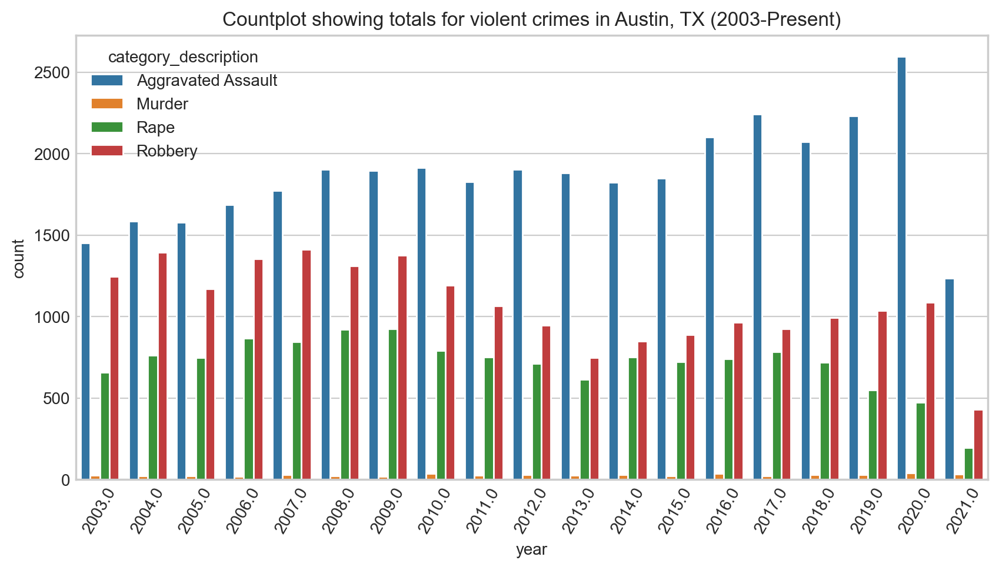

,Aggravated Assault,Rape,Robbery,Murder,TOTAL
occurred_date_time,,,,,
2003-01-31,120,50,73,3,246
2003-02-28,82,31,88,2,203
2003-03-31,124,56,109,3,292
2003-04-30,121,56,98,4,279
2003-05-31,135,47,97,1,280


,Aggravated Assault,Rape,Robbery,Murder,TOTAL
occurred_date_time,,,,,
2021-02-28,201,22,61,7,291
2021-03-31,200,59,64,8,331
2021-04-30,233,40,70,5,348
2021-05-31,243,32,93,6,374
2021-06-30,130,16,46,3,195


In [9]:
plt.figure(dpi=200, figsize=(10, 5))
plt.xticks(rotation="60")
sb.countplot(x="year", hue="category_description", data=df).set_title(
    "Countplot showing totals for violent crimes in Austin, TX (2003-Present)"
)
plt.show()

monthly = pd.DataFrame(
    df[df["category_description"] == "Aggravated Assault"].resample("M").size()
)
monthly.columns = ["Aggravated Assault"]

for i in df["category_description"].unique():
    monthly[i] = pd.DataFrame(df[df["category_description"] == i].resample("M").size())

monthly["TOTAL"] = monthly.sum(axis=1)

crimeType = monthly.columns

display(monthly.head())
display(monthly.tail())

<AxesSubplot:title={'center':'Plot showing total offense counts by type (2003-Present)'}, xlabel='Offense Type', ylabel='Total Offenses'>

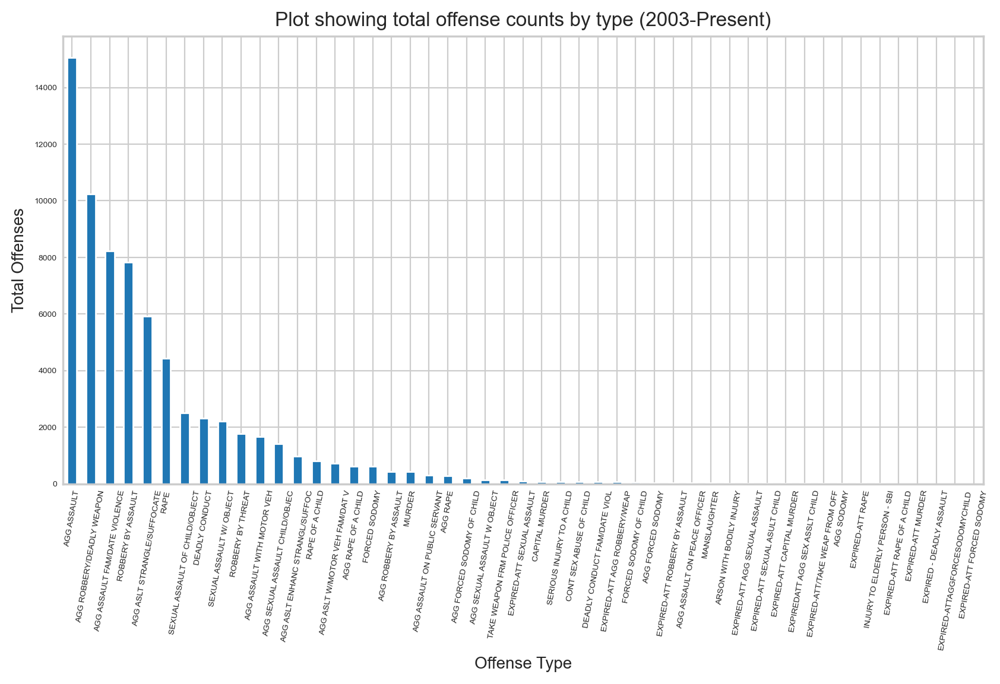

In [10]:
plt.figure(dpi=200)
df.highest_offense_description.value_counts().plot.bar(
    figsize=(10, 5),
    title="Plot showing total offense counts by type (2003-Present)",
    ylabel="Total Offenses",
    xlabel="Offense Type",
    rot=80,
    fontsize=5,
)

-----------------------------------------------------------------
Calculating and plotting time series with moving average included
-----------------------------------------------------------------


<Figure size 432x288 with 0 Axes>

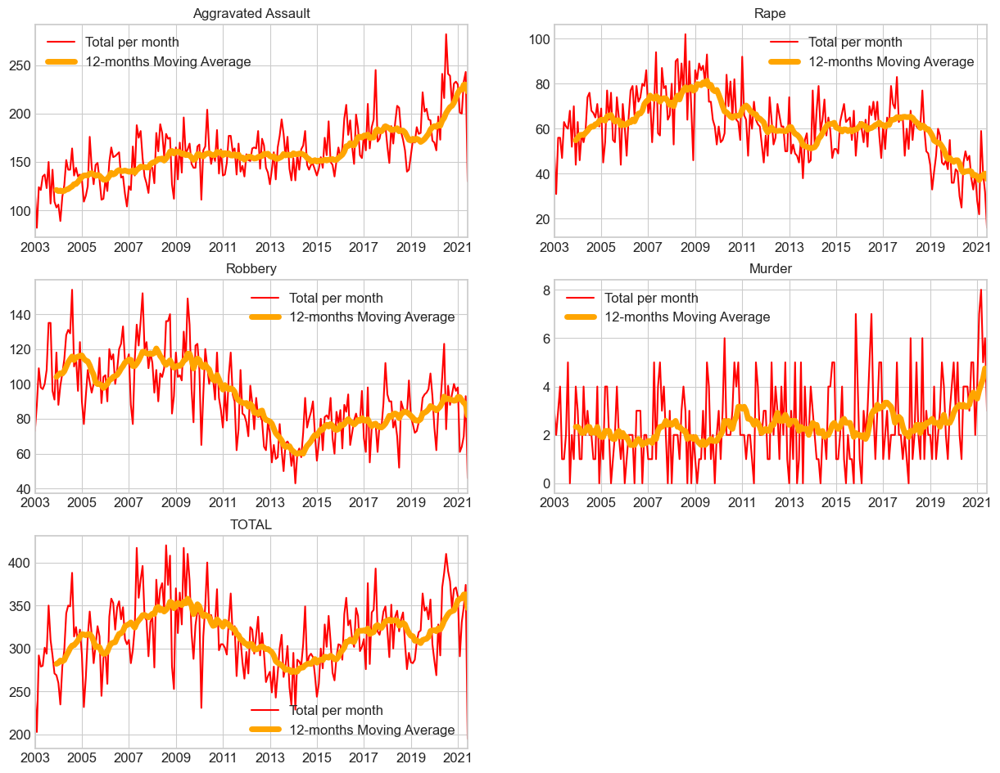

-----------------------------------------------
 Calculating and visualizing the 1st difference
-----------------------------------------------


<Figure size 432x288 with 0 Axes>

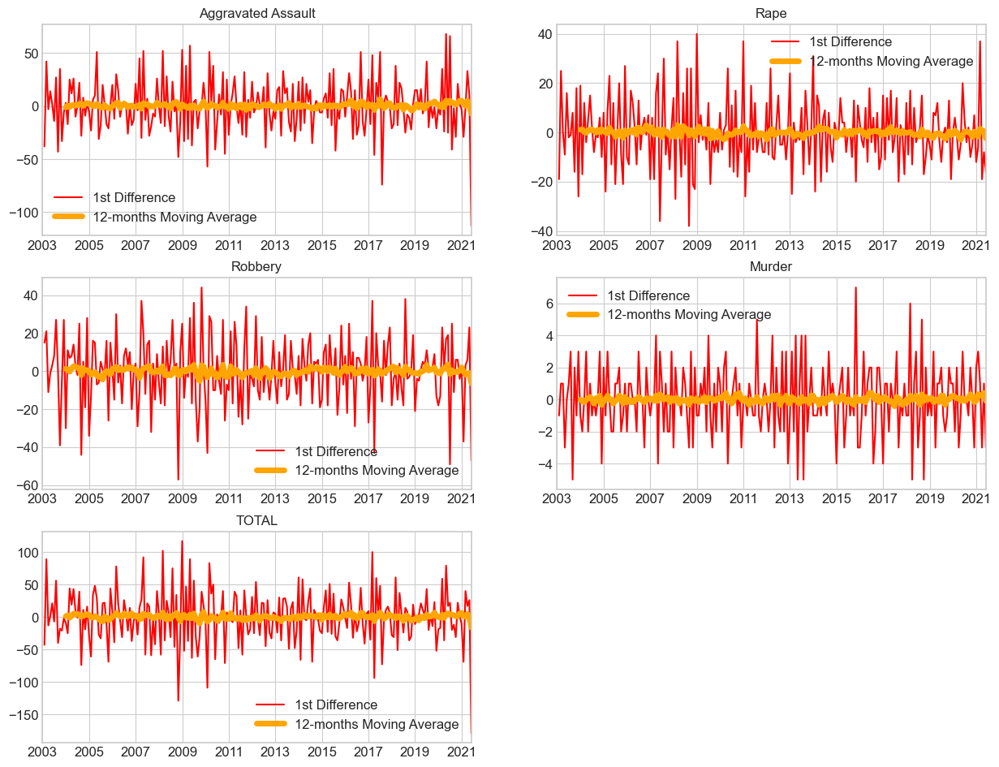

In [11]:
print("-----------------------------------------------------------------")
print("Calculating and plotting time series with moving average included")
print("-----------------------------------------------------------------")
plt.figure(1)
plt.figure(figsize=(15, 20), dpi=100)

i = 521
for eachCrime in crimeType:
    plt.subplot(i)
    monthly[eachCrime].plot(color="red", linewidth=1.5, label="Total per month")
    monthly[eachCrime].rolling(window=12).mean().plot(
        color="orange", linewidth=5, label="12-months Moving Average"
    )
    plt.title(eachCrime, fontsize=12)
    plt.xlabel("")
    plt.legend(prop={"size": 12})
    plt.tick_params(labelsize=12)
    i = i + 1
plt.show()

print("-----------------------------------------------")
print(" Calculating and visualizing the 1st difference")
print("-----------------------------------------------")
# Initiate the figure and define size
plt.figure(1)
plt.figure(figsize=(15, 20), dpi=100)

# Using a for loop to plot each type of crime with a moving average
i = 521
for eachCrime in crimeType:
    plt.subplot(i)
    monthly[eachCrime].diff().plot(color="red", linewidth=1.5, label="1st Difference")
    monthly[eachCrime].rolling(window=12).mean().diff().plot(
        color="orange", linewidth=5, label="12-months Moving Average"
    )
    plt.title(eachCrime, fontsize=12)
    plt.xlabel("")
    plt.legend(prop={"size": 12})
    plt.tick_params(labelsize=12)
    i = i + 1

### Prepping the data for modeling  

In [12]:
# Create a data frame with the 1st difference

montlhy_1stDiff = monthly.diff().dropna()

# Create a data frame with the results of the ADF test for each type

adfullerResults = pd.DataFrame(
    columns=crimeType,
    index=["ADF", "Critical Value 1%", "Critical Value 5%", "p-value"],
)
for eachType in crimeType:
    adf = adfuller(montlhy_1stDiff[eachType])
    adfullerResults[eachType] = (
        "{:.4f}".format(adf[0]),
        "{:.4f}".format(adf[4]["1%"]),
        "{:.4f}".format(adf[4]["5%"]),
        "{:.4f}".format(adf[1]),
    )
adfullerResults

,Aggravated Assault,Rape,Robbery,Murder,TOTAL
ADF,-9.2741,-7.9925,-8.3557,-7.3198,-6.4900
Critical Value 1%,-3.4619,-3.4619,-3.4617,-3.4623,-3.4620
Critical Value 5%,-2.8754,-2.8754,-2.8753,-2.8756,-2.8755
p-value,0.0000,0.0000,0.0000,0.0000,0.0000


'Aggravated Assault'

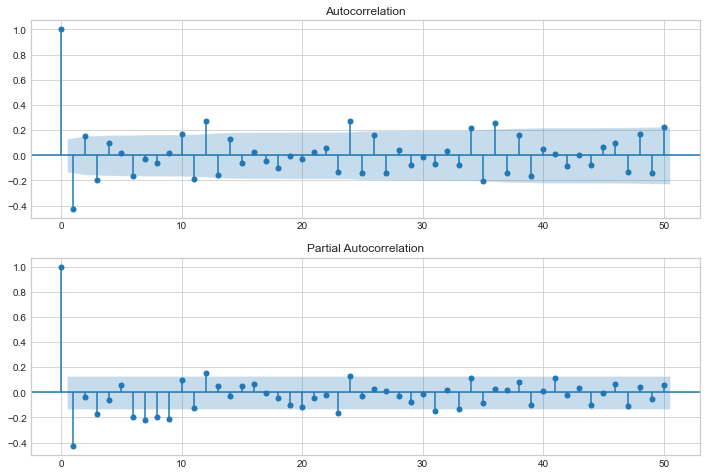

In [13]:
display(montlhy_1stDiff[crimeType[0]].name)
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(montlhy_1stDiff[crimeType[0]], lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(montlhy_1stDiff[crimeType[0]], lags=50, ax=ax2)

In [14]:
p = d = q = range(0, 2)

pdq = list(itertools.product(p, d, q))

seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print("Examples of parameter combinations for Seasonal ARIMA...")
print("SARIMAX: {} x {}".format(pdq[1], seasonal_pdq[1]))
print("SARIMAX: {} x {}".format(pdq[1], seasonal_pdq[2]))
print("SARIMAX: {} x {}".format(pdq[2], seasonal_pdq[3]))
print("SARIMAX: {} x {}".format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [15]:
# Creating a function to use a pipeline
def myArima(crimeTypeSeries):
    print("Training for:", crimeTypeSeries.name)
    lowestAIC = 999999999
    bestOrder = 0
    bestSeasonal_order = 0
    i = 0
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(
                    crimeTypeSeries, order=param, seasonal_order=param_seasonal
                )
                results = mod.fit()
                newAIC = results.aic
                if newAIC < lowestAIC:
                    lowestAIC = newAIC
                    bestOrder = param
                    bestSeasonal_order = param_seasonal
                i = i + 1
                print("\r", "Calculating: {:.0f}%".format(i / 64 * 100), end="")
            except:
                i = i + 1
                print("\r", "Calculating: {:.0f}%".format(i / 64 * 100), end="")
                continue
    print("\nBest parameters: SARIMA{}x{}12".format(param, param_seasonal))
    mod = sm.tsa.statespace.SARIMAX(
        crimeTypeSeries, order=bestOrder, seasonal_order=bestSeasonal_order
    )
    results = mod.fit()
    results.plot_diagnostics(figsize=(15, 12))
    plt.show()
    pred = results.get_prediction(start=168, end=230, dynamic=False)
    pred_ci = pred.conf_int()
    pred_ci.head()
    plt.figure(figsize=(15, 6))
    ax = crimeTypeSeries.plot(label="observed")
    plt.title("Actual and Forecast", fontsize=12)
    pred.predicted_mean.plot(
        ax=ax, label="One-step ahead forecast", color="red", alpha=0.7, lw=4
    )
    ax.fill_between(
        pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color="r", alpha=0.3
    )
    ax.set_xlabel("Years")
    ax.set_ylabel("Number of crime")
    plt.legend()
    plt.show()
    return results

Training for: Aggravated Assault
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


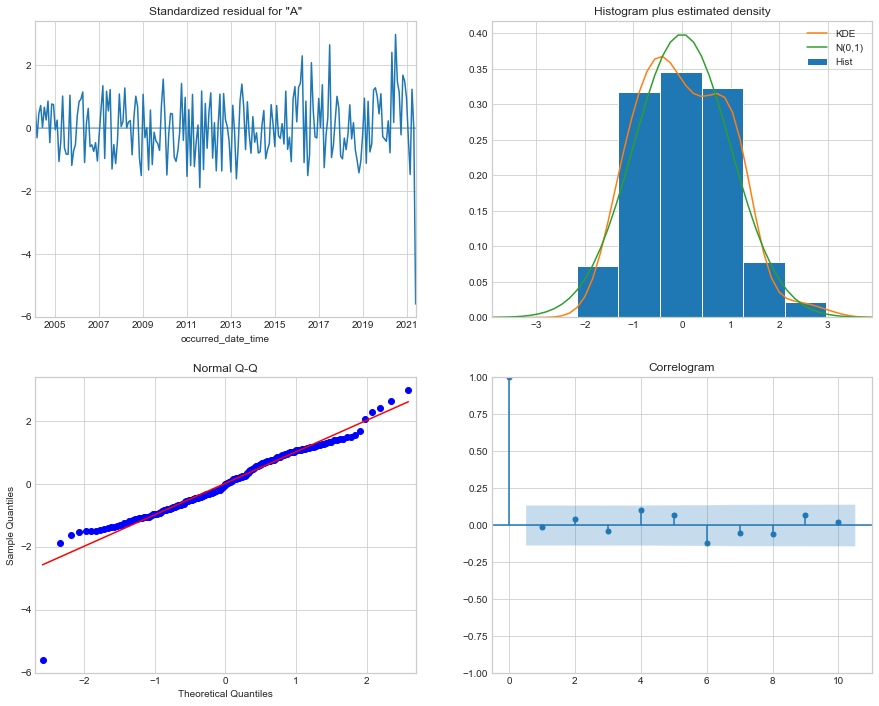

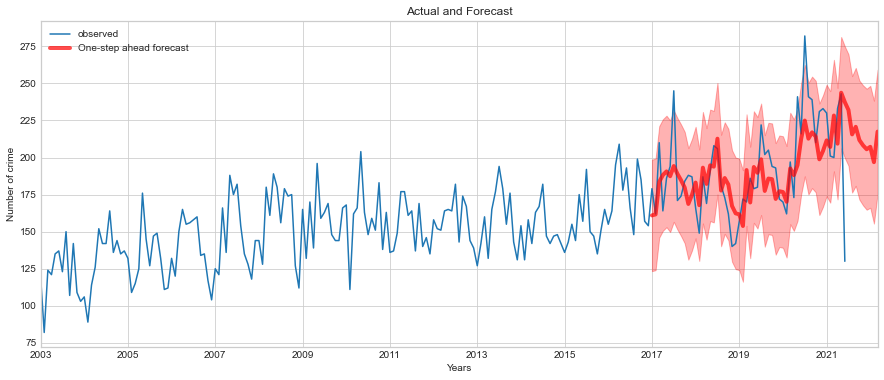

Training for: Rape
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


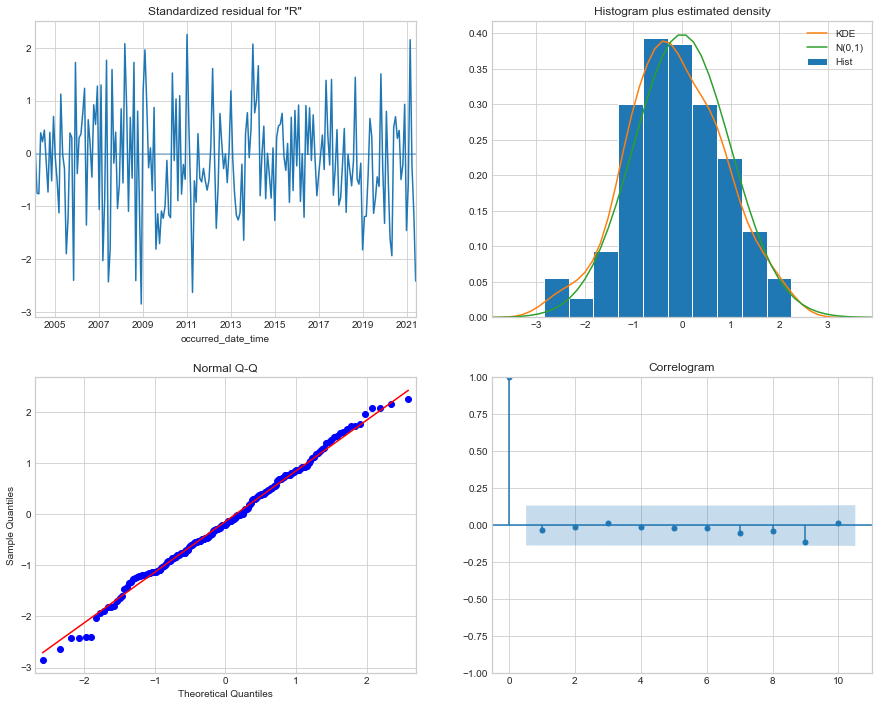

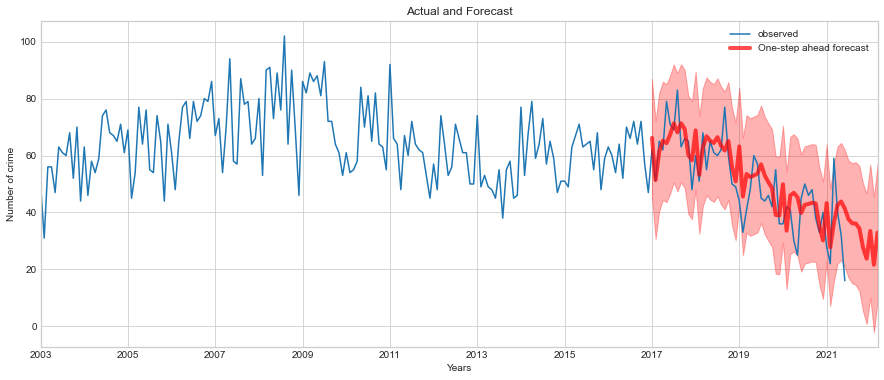

Training for: Robbery
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


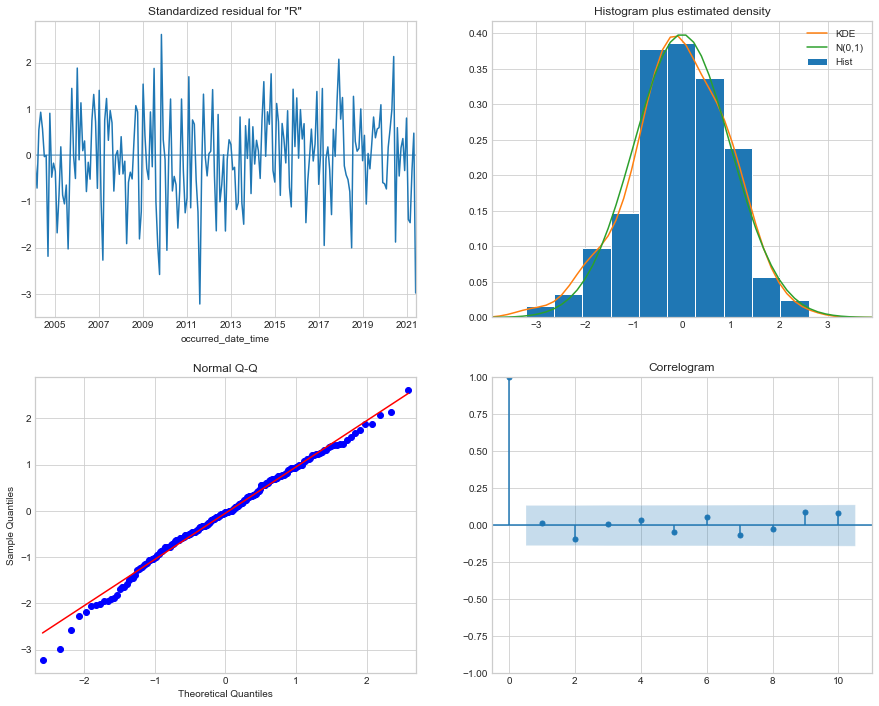

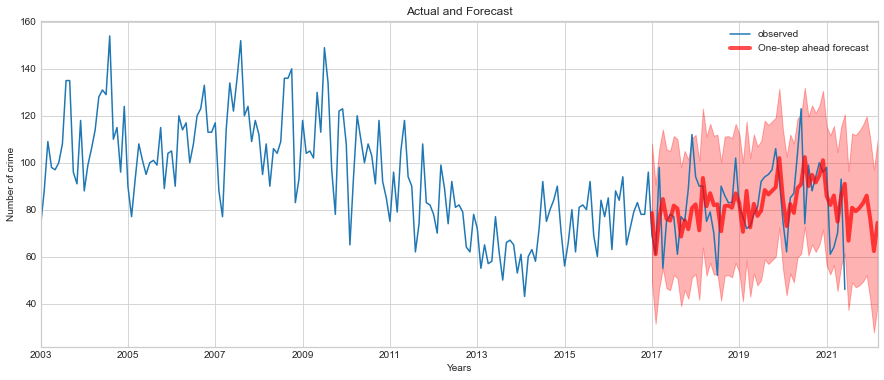

Training for: Murder
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


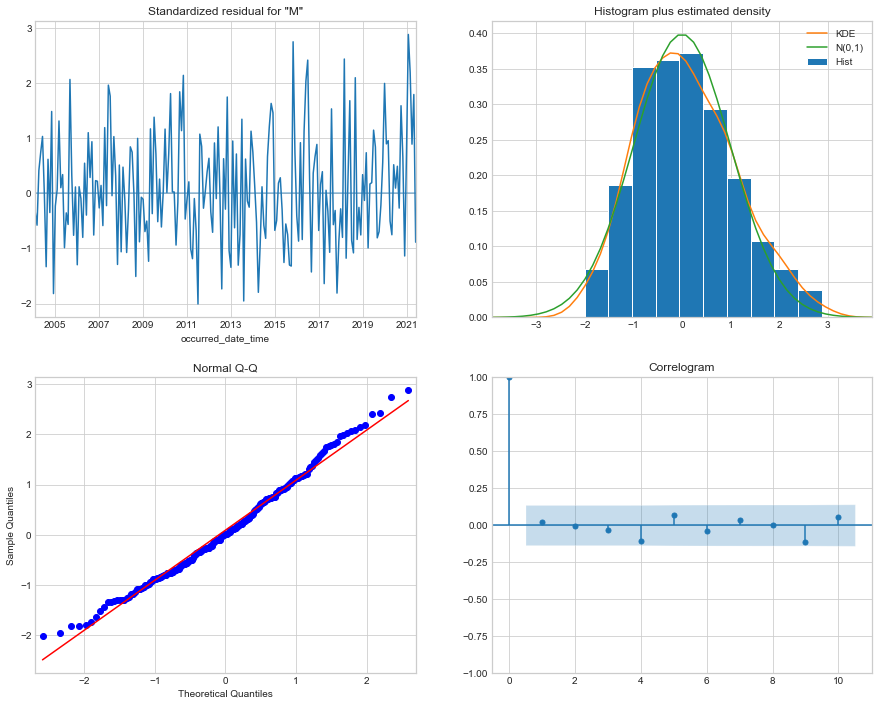

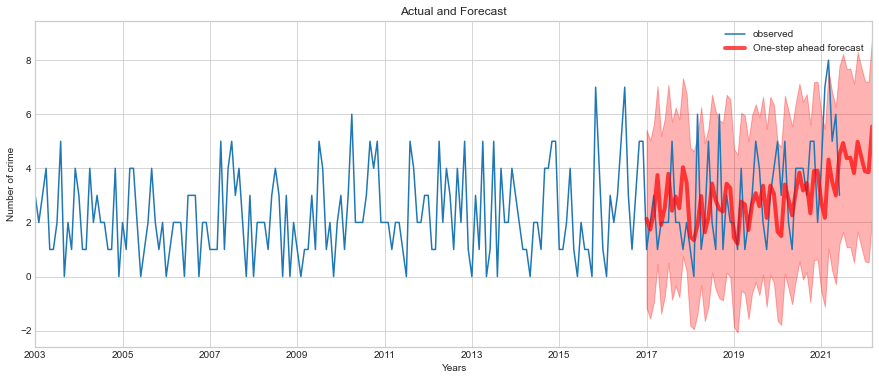

Training for: TOTAL
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


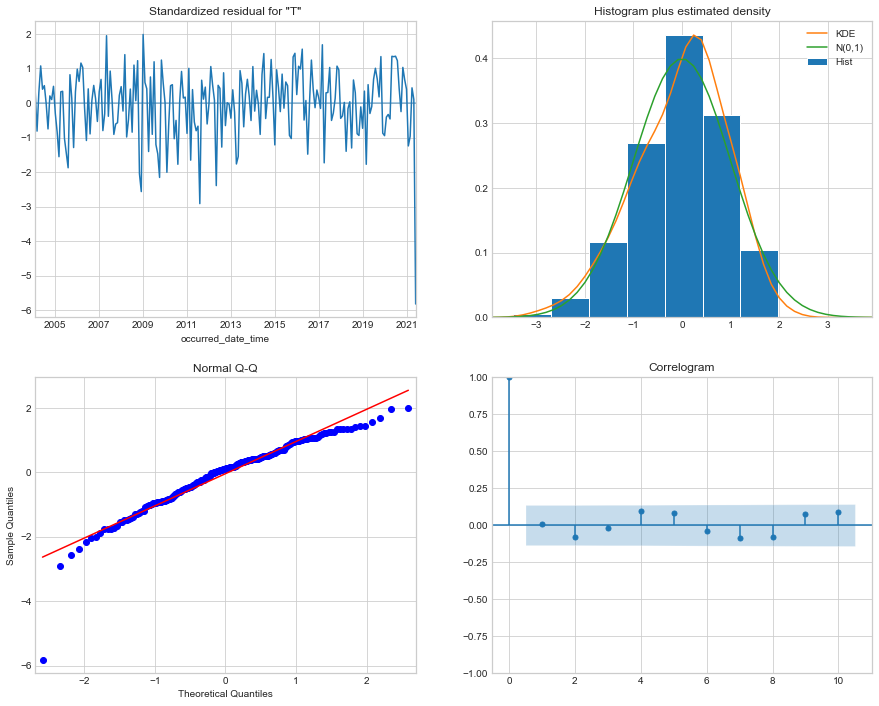

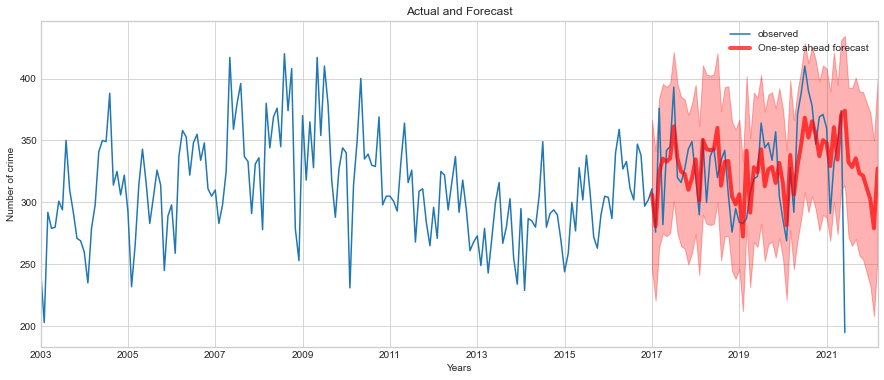

In [16]:
results = []
for i in crimeType:
    results.append(myArima(monthly[i]))

In [17]:
predictions = []
for i in range(0, len(results)):
    predictions.append(
        results[i].get_prediction(start=204, end=230, dynamic=False).predicted_mean
    )

In [18]:
# Calculating MAPE error
predictions = pd.DataFrame(predictions)
predictions = predictions.transpose()
predictions.columns = monthly.columns
errors = (monthly - predictions) / monthly
errors.dropna(how="all", inplace=True)
n = len(errors)

MAPE = round((errors.abs().sum() / n) * 100, 2)
print(
    "The Mean Absolute Percentage Error for each type for the year 01/2021 to 12/2021"
)
display(MAPE)

The Mean Absolute Percentage Error for each type for the year 01/2021 to 12/2021


Aggravated Assault    12.68
Rape                  34.28
Robbery               19.20
Murder                45.84
TOTAL                 11.46
dtype: float64

In [19]:
# Formulating the confidence interval
predictions_ci = []
for i in range(0, len(results)):
    predictions_ci.append(
        results[i].get_prediction(start=204, end=230, dynamic=False).conf_int()
    )

# display(predictions_ci)

# Building a forecast table
def forecastMonth(year_month):
    for i in range(0, 9):
        pred_df = round(predictions.iloc[:, i : i + 1][year_month], 0)
        ci_df = round(predictions_ci[i][year_month], 0)
        ci_df.columns = ["Lower CI", "Upper CI"]
        frames = (pred_df, ci_df)
        display(pd.concat(frames, axis=1))


forecastMonth("2021-06")

,Aggravated Assault,Lower CI,Upper CI
2021-06-30,237.0,200.0,275.0


,Rape,Lower CI,Upper CI
2021-06-30,41.0,21.0,62.0


,Robbery,Lower CI,Upper CI
2021-06-30,91.0,61.0,121.0


,Murder,Lower CI,Upper CI
2021-06-30,4.0,1.0,8.0


,TOTAL,Lower CI,Upper CI
2021-06-30,374.0,314.0,434.0


IndexError: list index out of range

## Predicting crime rates with Facebook Prophet 
    
### Modeling the data as-is

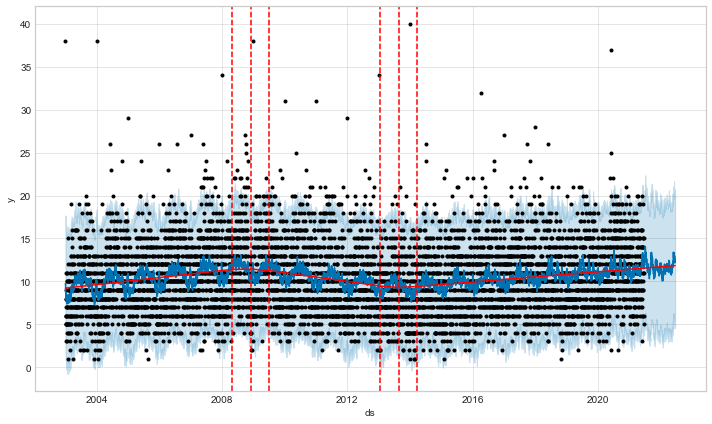

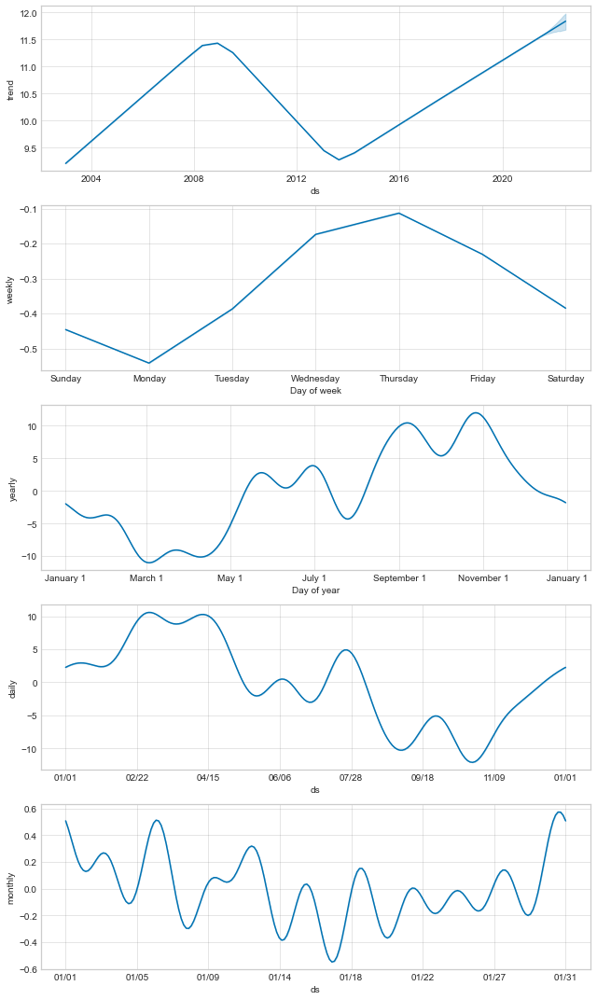

In [20]:
# Prepping to forecast
df_fbprophet = df.copy()
df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})
# df_m_final["y"] = np.log(df_m_final["y"])
df_m_final["y"] = pd.to_numeric(df_m_final["y"])
y = df_m_final["y"].to_frame()
y.index = df_m_final["ds"]
n = np.int(y.count())

# Fitting and configuring the model
m = Prophet(interval_width=0.95)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)

fig2_1 = plot_plotly(m, forecast)
fig2_1

In [21]:
# The forecast is 'log transformed', so we need to 'inverse' it back by using the exp
forecast_df_exp = np.exp(forecast[["yhat", "yhat_lower", "yhat_upper"]])
forecast_df_exp.index = forecast["ds"]

# Calculating MAPE error
error = forecast_df_exp["yhat"] - y["y"]
MAPE_df = (error / y["y"]).abs().sum() / n * 100
round(MAPE_df, 2)

549220.16

### Mitigating outlier effects on moodel accuracy 

In [22]:
# Make another copy of the data frame as m2
df_prophet2 = df_m_final.copy()

# Define the Upper Control Limit and Lower Control Limit as 3 standard deviations from the mean
ucl = df_prophet2.mean() + df_prophet2.std() * 3
lcl = df_prophet2.mean() - df_prophet2.std() * 3

# display the number of outliers found
print(
    "Above 3 standard deviations: ",
    df_prophet2[df_prophet2["y"] > ucl["y"]]["y"].count(),
    "entries",
)
print(
    "Below 3 standard deviations: ",
    df_prophet2[df_prophet2["y"] < lcl["y"]]["y"].count(),
    "entries",
)

Above 3 standard deviations:  44 entries
Below 3 standard deviations:  0 entries


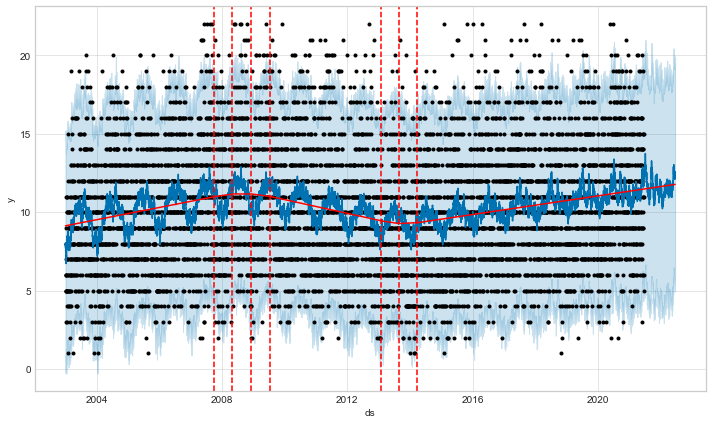

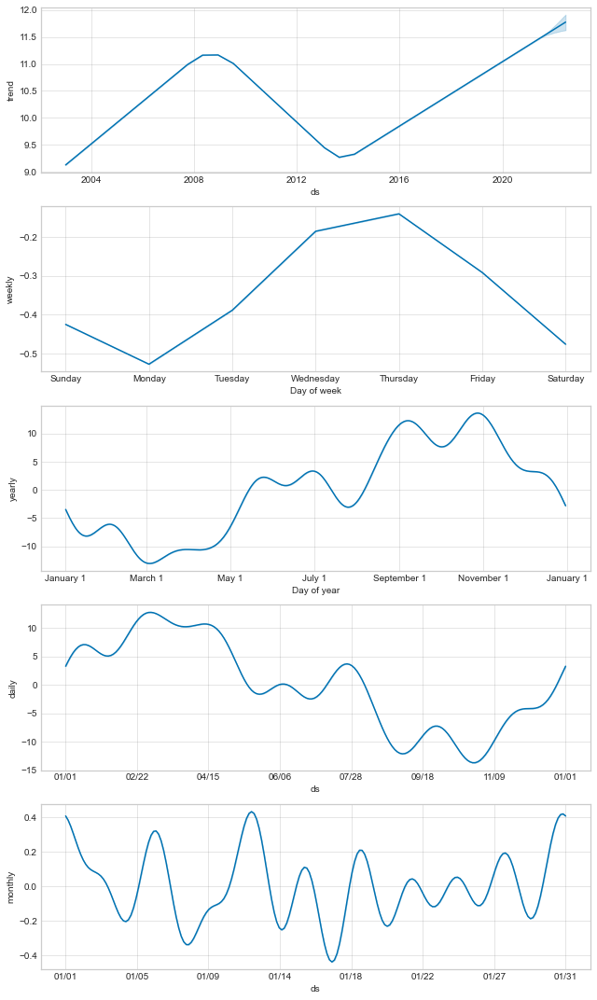

In [23]:
# Remove them by setting their value to None. Prophet says it can handle null values.
df_prophet2.loc[df_prophet2["y"] > ucl["y"], "y"] = None
df_prophet2.loc[df_prophet2["y"] < lcl["y"], "y"] = None

# Log transformation
# df_prophet2["y"] = np.log(df_prophet2["y"])
df_prophet2["y"] = pd.to_numeric(df_prophet2["y"])

# Run Prophet using model 2
m2 = Prophet(interval_width=0.95)
m2.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m2.add_seasonality(name="weekly", period=52, fourier_order=10)
m2.add_seasonality(name="daily", period=365, fourier_order=10)
m2.fit(df_prophet2)

future = m2.make_future_dataframe(periods=365)

forecast_m2 = m2.predict(future)

fig_m2 = m2.plot(forecast_m2)
a = add_changepoints_to_plot(fig_m2.gca(), m2, forecast_m2)

fig2m2 = m2.plot_components(forecast_m2)

fig2_1m2 = plot_plotly(m2, forecast_m2)
fig2_1m2

In [24]:
# Re-inversing the forecast

forecast_m2_exp = np.exp(forecast_m2[["yhat", "yhat_lower", "yhat_upper"]])
forecast_m2_exp.index = forecast_m2["ds"]

# RecalculatinG MAPE error

error = forecast_m2_exp["yhat"] - y["y"]
MAPE_m2 = (error / y["y"]).abs().sum() / n * 100
round(MAPE_m2, 2)

470478.97

  0%|          | 0/4 [00:00<?, ?it/s]

,horizon,mse,rmse,mae,mape,mdape,coverage
0,37 days,14.611564,3.822508,3.134629,0.308841,0.228826,0.931034
1,38 days,14.066053,3.750474,3.063334,0.299762,0.227060,0.936207
2,39 days,14.240610,3.773673,3.087975,0.299475,0.228826,0.937931
3,40 days,14.251657,3.775137,3.086615,0.299200,0.227060,0.937931
4,41 days,14.494751,3.807197,3.112355,0.295782,0.228826,0.931034


,horizon,mse,rmse,mae,mape,mdape,coverage
324,361 days,16.243404,4.030311,3.244541,0.428977,0.234555,0.924138
325,362 days,16.392759,4.048797,3.254763,0.429712,0.234555,0.924138
326,363 days,16.604478,4.074859,3.290543,0.431214,0.235412,0.924138
327,364 days,16.678977,4.083990,3.309061,0.432674,0.237863,0.924138
328,365 days,16.676146,4.083644,3.329457,0.417279,0.240062,0.931034


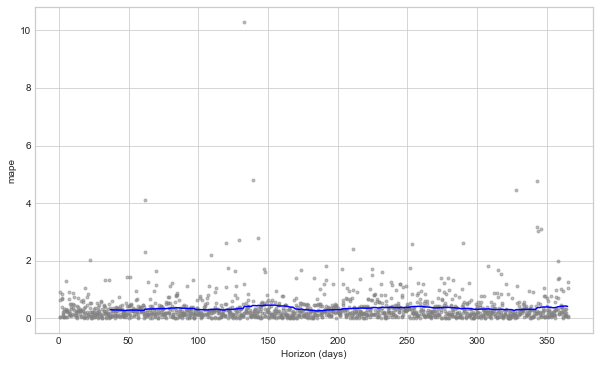

In [25]:
# Doing a diagnostic and performance metrics check visualizing the results

b = cross_validation(m2, initial="5110 days", period="365 days", horizon="365 days")

p = performance_metrics(b)
display(p.head())
display(p.tail())

fig4 = plot_cross_validation_metric(b, metric="mape")